# Neural Networks for Images

Examples for Scientific Papers:
- [Theoretical](https://arxiv.org/abs/1711.10925)
- [Practical](https://arxiv.org/abs/1506.01497)

You can have more than 1 test set but we need to always have 1 chosen at random.

[Covariate shift](https://www.seldon.io/what-is-covariate-shift) is a situation in which the distribution of the model's input features in production changes compared to what the model has seen during training and validation. Covariate shift is a change in the distribution of the model's inputs between training and production data

Something as subtle as a change in lighting could shift the distribution of data points, and thereby lower the accuracy of the model. In the case of facial recognition, training data may lack specific ethnicities or ages of subject. When deployed in a live environment, subjects that aren’t in line with training data may have an unrecognisable feature distribution.

Covariate drift can cause serious issues with speech recognition models because of the diversity of voices, dialects and accents in spoken word. For example, a model may be trained on English speakers from a specific area with a specific accent. Although the model may achieve a high degree of accuracy with the training data, it will become inaccurate when processing spoken language in a live environment. This is because processing speech with new dialects or accents will be a different input distribution to the training data.  

We can fix this with more real world data and retraining with it.

Interpreting NNs:
- [ZFNet](https://paperswithcode.com/method/zfnet) - ZFNet is a classic convolutional neural network. The design was motivated by visualizing intermediate feature layers and the operation of the classifier. Compared to AlexNet, the filter sizes are reduced and the stride of the convolutions are reduced.
- [Activation atlases](https://openai.com/research/introducing-activation-atlases) - Activation atlases are a new way to see some of what goes on inside that box
- [Saliency map](https://analyticsindiamag.com/what-are-saliency-maps-in-deep-learning/) - This [method](https://arxiv.org/pdf/1312.6034.pdf) is derived from the concept of saliency in images. Saliency refers to unique features (pixels, resolution etc.) of the image in the context of visual processing. These unique features depict the visually alluring locations in an image. Saliency map is a topographical representation of them.
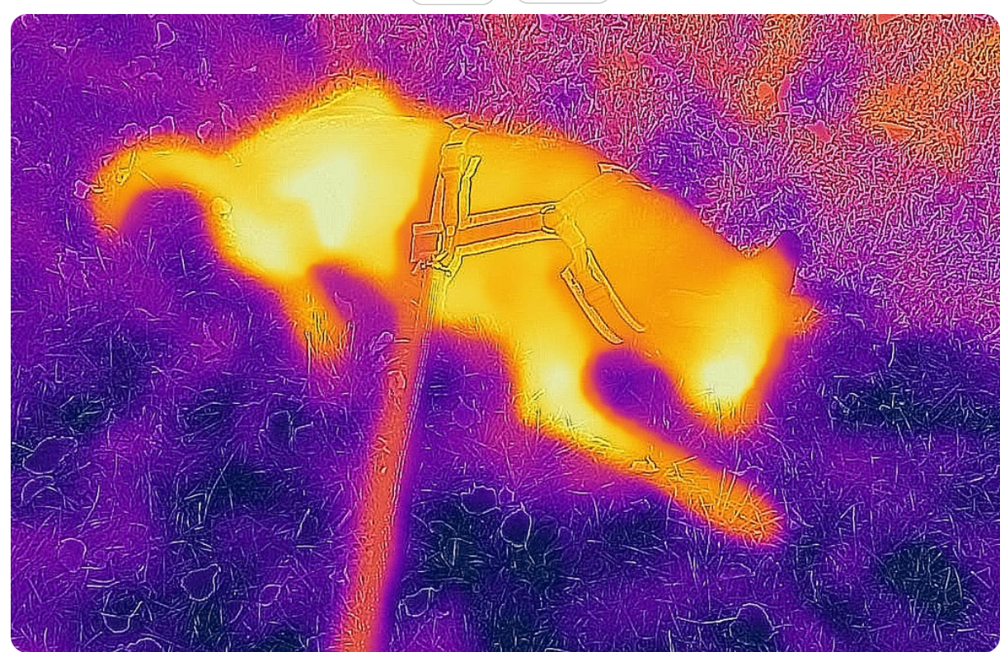

There is no limit to the problem we are solving with DL. There isn't only regression and classification like in ML.

We can do anything. All we need is a **Differentiable function** (because of GD) that represents what we want to achieve. 

## Convolutional Neural Networks

If you are working with images you always use convolutional NN and layers.

#### Convolution

Related to [Fourier transform](https://en.wikipedia.org/wiki/Fourier_transform)

We apply a convolution like a filter (from the back to the front of the image): 

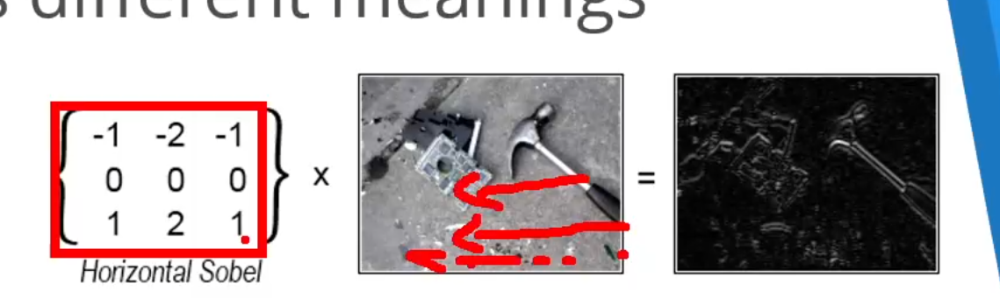

[Cross-correlation](https://en.wikipedia.org/wiki/Cross-correlation) but we call it **Convolution**

[Template Matching](https://medium.com/mlearning-ai/image-template-matching-using-cross-correlation-2f2b8e59f254)

Convolutional volume? - An image has 3 dimentions (height, width, number of channels) 

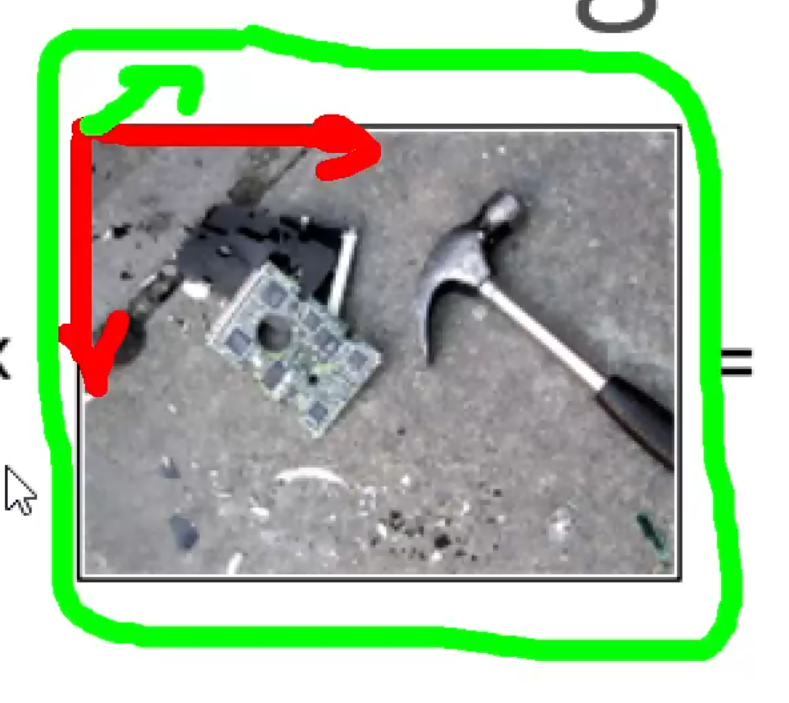

The channels of an image we treat as independent! RGB. On each channel we can apply a different filter. 

Similar pixels have similar characteristics but not true for the channels. We assume they are completely independent. This allows us to perform a lot of convolutions at once.

In summary:

We pick a convolution (filter) that is well knows to us. For example showing vertical/horizontal edges([Sobel edge detection](https://homepages.inf.ed.ac.uk/rbf/HIPR2/sobel.htm)) and apply it to an image to gain information on it.

We can do this with many filters since we have arithmetics for images. We can very easily add substract etc images. So working with these filters and combining the results is very easy.

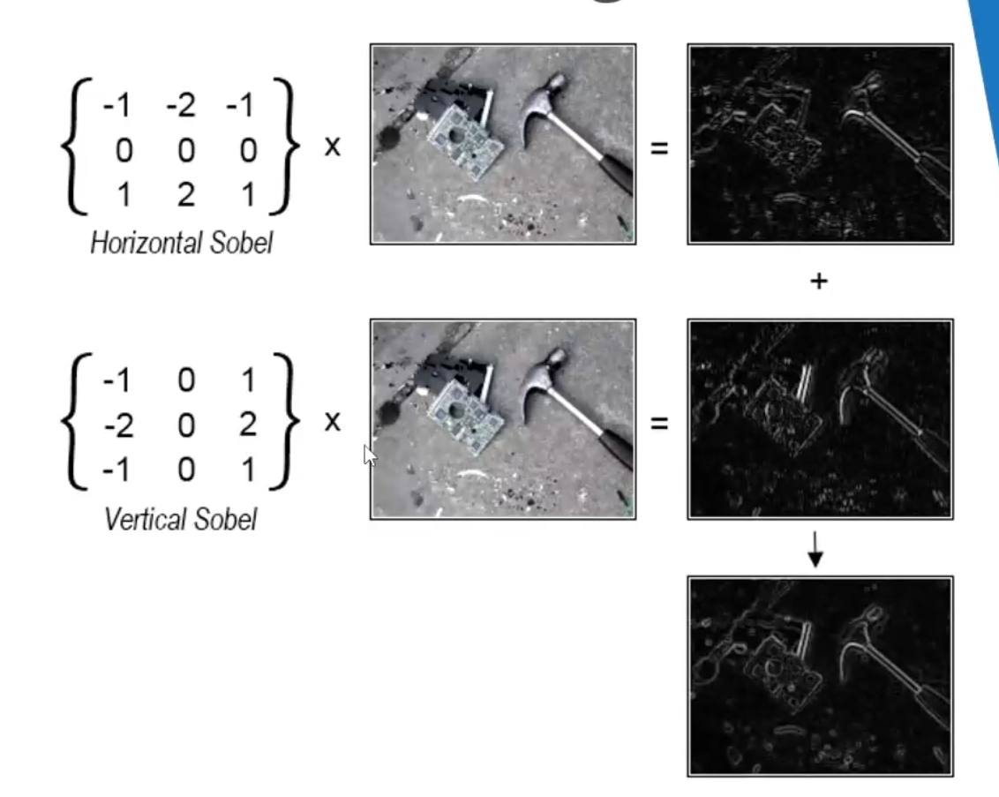

The filters are usually small and odd in size. 3, 5, 7 etc. We want to have a central pixel.

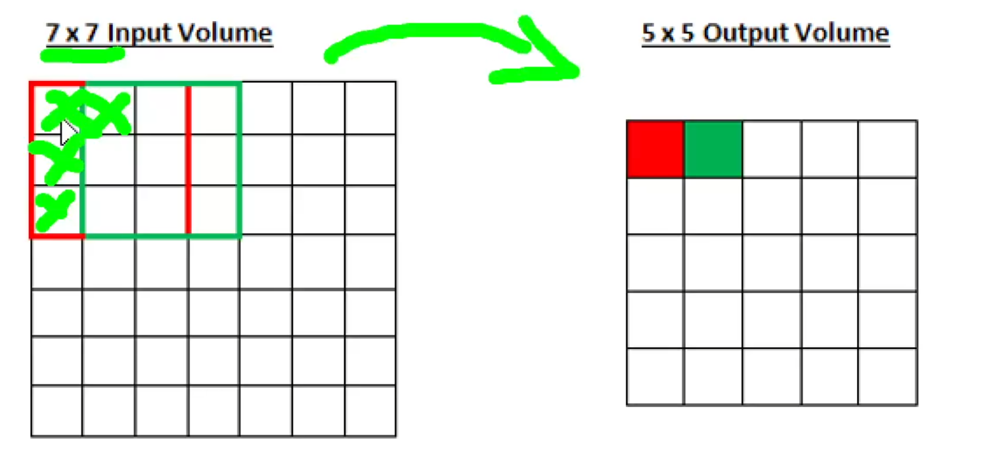

We can see that we remove a "frame" in a sense when applying these filters. The outer pixels are removed. The bigger the filter is size the more pixels we remove.

We deal with this issue through **Padding** - adding pixels on the outside so the frame can be included in the result. There are 2 types:
 - Valid convolution - no padding
   - If we use valid padding with many conv filters one after the other. At some point the volume of the image gets so small that it is unusable.
 - Same convolution - pad so that the output size remains unchanged. We usually fill these newly added pixels with 0.5 (average in a normalized image between 0 and 1)

The sliding window step(stride) can be different than 1. In this case it is 2. But this leads to less output pixels:

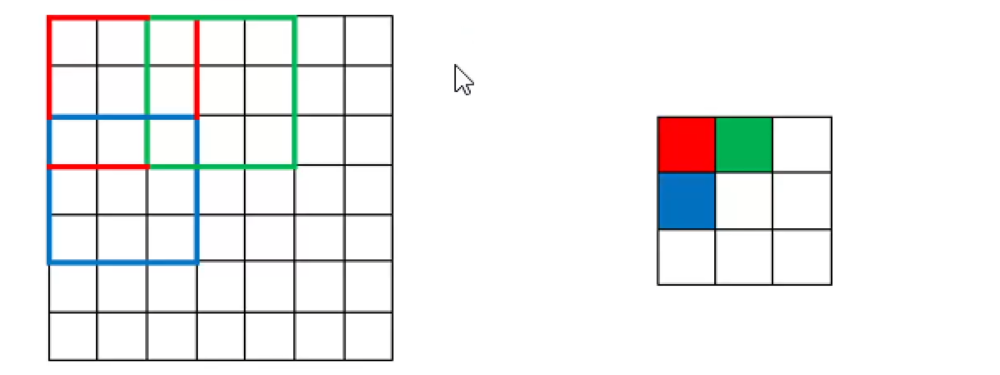

Dilated convolution also exists. It is well ... more dilated like the image shows..

![SegmentLocal](images/0_3cTXIemm0k3Sbask.gif "segment")

Reduction on the 3rd dimention (channels) - we get a gray scale image

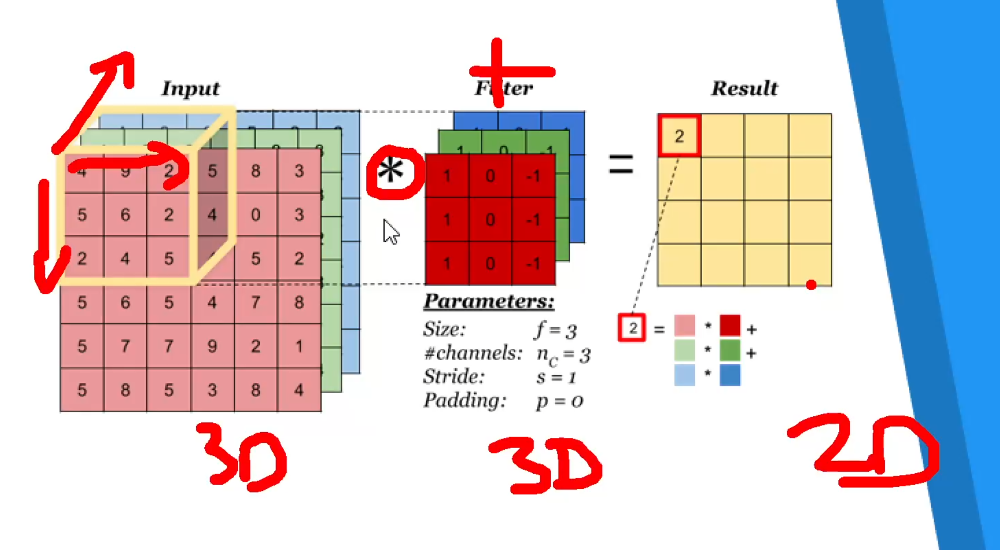

An ensamble of convolutions resembles a fully connected NN (dense NN)

Activation is the result of the operation: In this case the 3x3 matrix

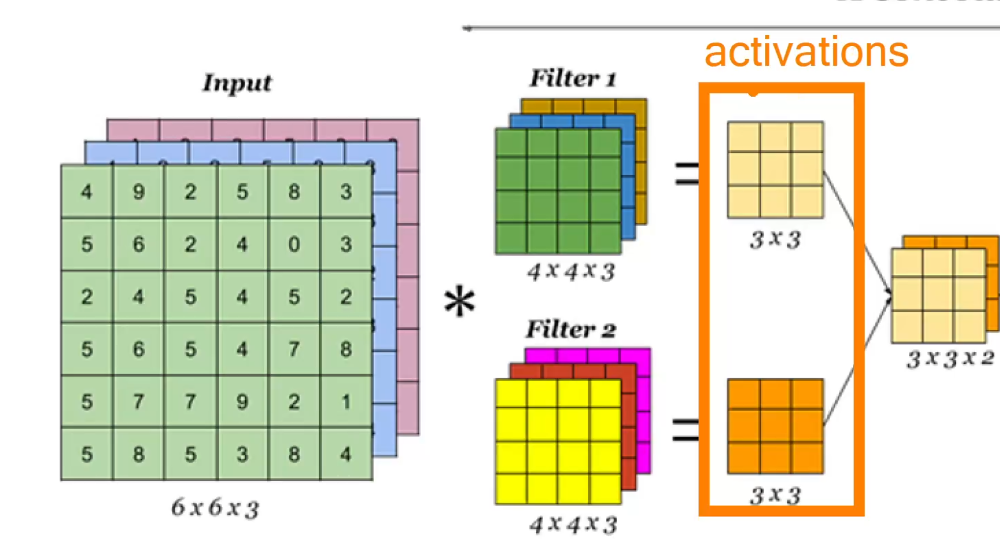

Convolution is a linear operation. Therefore we run into the same problems with linear NN. So we add ReLU (Sum of all activation results) to add non-linearity 

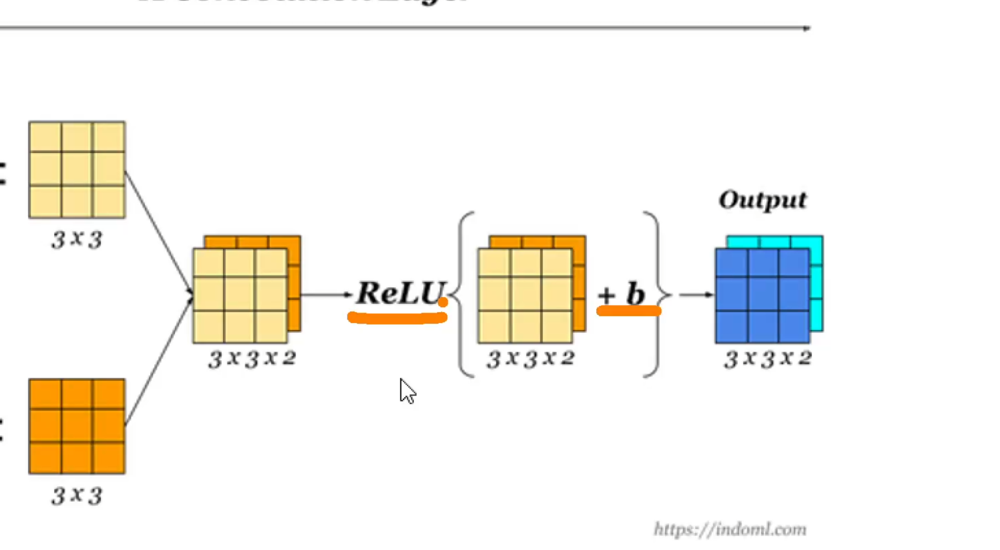

Convolution satisfies the requirements for linearity: 

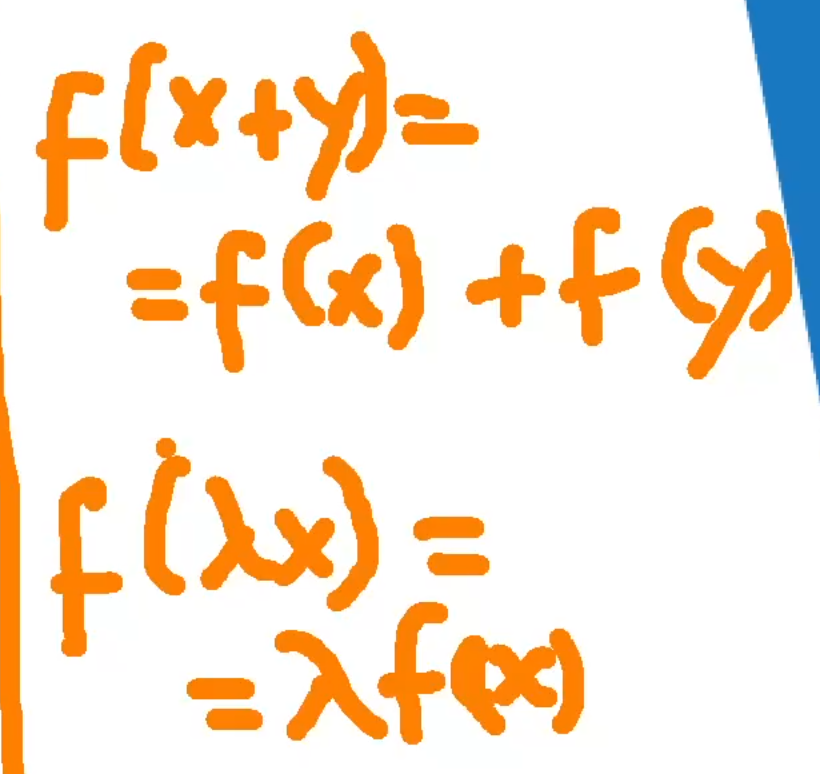

$ y = 3*x + 5 $ is not linear. Doesn't satisfy the second requirement for the scalar

Every filter is applied to every pixel of the image and vise versa. But how do we train the NN? 

### **We modify the filter numbers.**

Before some of the filters we might know and stright up apply them. But nowadays we let the NN learn which are the most optimal filters for optimizing the loss function.

The result of the filters being applied to the image and stacked in an ensamble isn't an image. It looks like an image and we can try to show it but it isn't an image exactly. We can give it to other conv layers and achieve DNN like this.

The result after a conv layer is called a **feature map**. We can call it activation as well. But the combination of the output layers is called a feature map

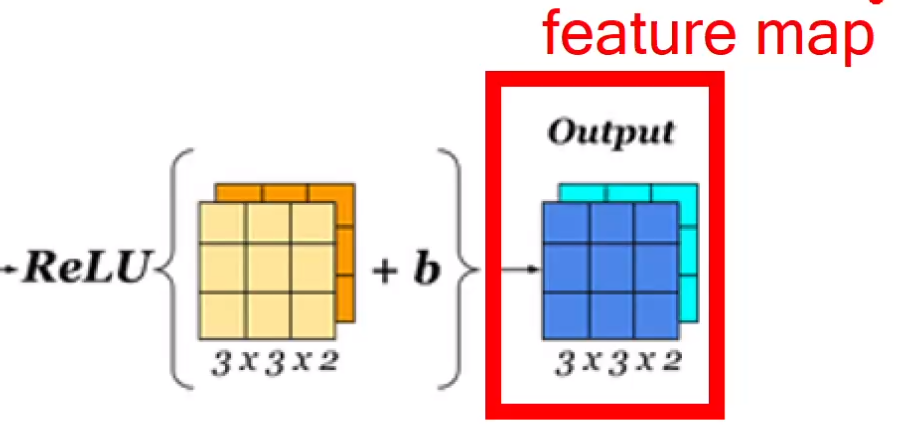

## [Pooling](https://www.geeksforgeeks.org/cnn-introduction-to-pooling-layer/)

The pooling operation involves sliding a two-dimensional filter over each channel of feature map and summarising the features lying within the region covered by the filter. 

Why to use Pooling Layers? - Pooling layers are used to reduce the dimensions of the feature maps. Thus, it reduces the number of parameters to learn and the amount of computation performed in the network.
 - The pooling layer summarises the features present in a region of the feature map generated by a convolution layer. So, further operations are performed on summarised features instead of precisely positioned features generated by the convolution layer. This makes the model more robust to variations in the position of the features in the input image.

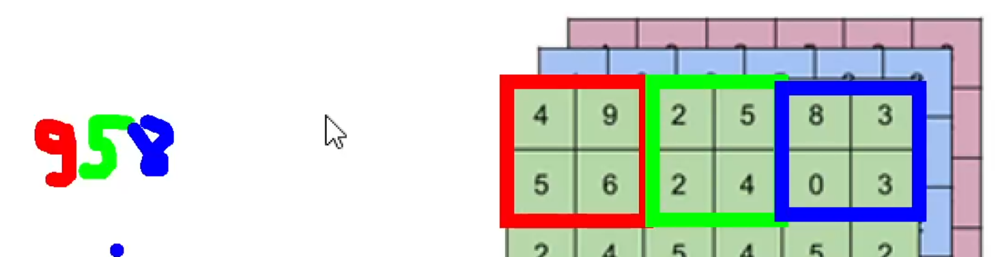

Types of pooling:
 - **Max pooling**: During the filter applications the resulting feature map has higher values at some pixels. These values come from strongly activated units/filters and are more important. So doing Max pooling which is chosing the max value in the 2x2 matrix preserves and accentuates these more important pixels. (The data is scaled so the bigger values have been multiplied by a higher value weight which means it is more important)
 - **Average pooling**: Average pooling computes the average of the elements present in the region of feature map covered by the filter. Thus, while max pooling gives the most prominent feature in a particular patch of the feature map, average pooling gives the average of features present in a patch. 
 - **Global pooling**: Global pooling reduces each channel in the feature map to a single value. Thus, an $n_h \times n_w \times n_c$ feature map is reduced to $1 \times 1 \times n_c$ feature map. This is equivalent to using a filter of dimensions nh x nw i.e. the dimensions of the feature map. 
Further, it can be either global max pooling or global average pooling
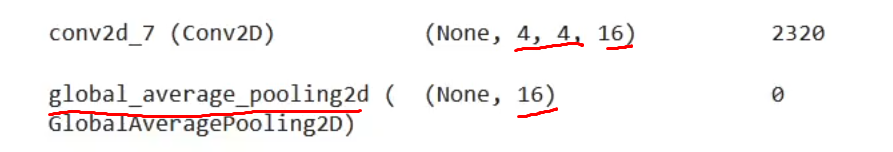.

Advantages of Pooling Layer:
- **Dimensionality reduction**: The main advantage of pooling layers is that they help in reducing the spatial dimensions of the feature maps. This reduces the computational cost and also helps in avoiding overfitting by reducing the number of parameters in the model.
- **Translation invariance**: Pooling layers are also useful in achieving translation invariance in the feature maps. This means that the position of an object in the image does not affect the classification result, as the same features are detected regardless of the position of the object.
- **Feature selection**: Pooling layers can also help in selecting the most important features from the input, as max pooling selects the most salient features and average pooling preserves more information.


Disadvantages of Pooling Layer:
 - **Information loss**: One of the main disadvantages of pooling layers is that they discard some information from the input feature maps, which can be important for the final classification or regression task.
 - **Over-smoothing**: Pooling layers can also cause over-smoothing of the feature maps, which can result in the loss of some fine-grained details that are important for the final classification or regression task.
 - **Hyperparameter tuning**: Pooling layers also introduce hyperparameters such as the size of the pooling regions and the stride, which need to be tuned in order to achieve optimal performance. This can be time-consuming and requires some expertise in model building.building.. 

## Why do convolutions work?

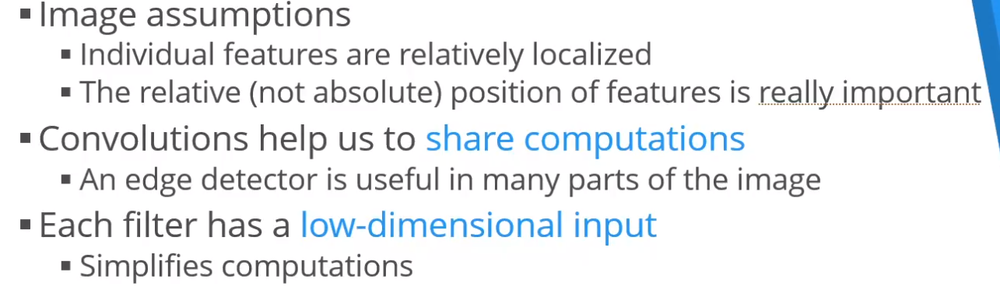

If we have a filter that detects an object no matter where that object is in the image the filter will catch it.

If we represent the image as a vector of pixels and align them one next to the other:
 - we retain the horizontal relations
 - but we lose the vertical relations

[Visualizing and Understanding Convolutional Networks](https://cs.nyu.edu/~fergus/papers/zeilerECCV2014.pdf)s

If we do a Dense NN like with numerical data we get this amount of weights for a SINGLE! layer. We also asume that there is a relationship between every 2 pixels which is silly.

The human brain doesn't work like a Dense NN. We are more hierarchical. First we see a tree then branches... leaves etc.. No just colors pixels like a DNN

In [1]:
# Number of weights in a layer for a standart image if we do Dense NN
(2000 * 1000 * 3 + 1) * 256

1536000256

In [2]:
# Number of parameters if we use convolutions 3x3
(256 + 1)*(3*3)

2313

In [1]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' 

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import tensorflow as tf

from tensorflow.keras.datasets import mnist

from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Input, Conv2D, MaxPool2D, Dense, Dropout, Flatten, Concatenate

In [4]:
(mnist_attributes_train, mnist_labels_train), (mnist_attributes_test, mnist_labels_test) = mnist.load_data()

In [5]:
(mnist_attributes_train.shape, mnist_labels_train.shape), (mnist_attributes_test.shape, mnist_labels_test.shape)

(((60000, 28, 28), (60000,)), ((10000, 28, 28), (10000,)))

In [6]:
mnist_attributes_train = tf.expand_dims(mnist_attributes_train, -1).numpy()
mnist_attributes_test = tf.expand_dims(mnist_attributes_test, -1).numpy()

In [7]:
mnist_attributes_train.shape[1:]

(28, 28, 1)

In [8]:
len(set(mnist_labels_train))

10

In [9]:
input_shape = mnist_attributes_train.shape[1:]
num_classes = len(set(mnist_labels_train))

In [10]:
tf.keras.backend.clear_session()

model = Sequential([
    Input(input_shape),
    Conv2D(32, 3, padding = "same", strides = 2, activation = "relu"),
    Conv2D(32, 3, padding = "same", activation = "relu"),
    MaxPool2D(),
    Conv2D(16, 3, padding = "same", strides = 2, activation = "relu"),
    Conv2D(16, 3, padding = "same", activation = "relu"),

    # We vectorize the image now because it is very small and we want each pixel to be conn with each neuron from the dense. Before it was too much, but now it is ok.
    # We start the classification from here
    Flatten(),
    
    Dense(16, activation = "relu"),
    Dropout(0.05),
    Dense(num_classes, activation = "softmax")
])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 14, 14, 32)        320       
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 14, 32)        9248      
                                                                 
 max_pooling2d (MaxPooling2  (None, 7, 7, 32)          0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 4, 4, 16)          4624      
                                                                 
 conv2d_3 (Conv2D)           (None, 4, 4, 16)          2320      
                                                                 
 flatten (Flatten)           (None, 256)               0         
                                                        

Strides kind of does feature selection and dimentionality reduction.

### Never put Dropout regularization after Conv layer.

Instead of making different filters to not activate, it would remove difference numbers in the filters which bricks them. We get bad filters this way.

Instead use [SpatialDropout2d()](https://www.tensorflow.org/api_docs/python/tf/keras/layers/SpatialDropout2D)

In [11]:
model.compile(optimizer = "adam", loss = "sparse_categorical_crossentropy", metrics = ["accuracy"])

If the gradients explode we reduce the epsilon hyperparam in ADAM

In [12]:
# we are lazy so we will use validation_split = 0.1. This will use a DIFFERENT 10% set of the training set for validation each epock
model.fit(mnist_attributes_train, mnist_labels_train, epochs = 20, validation_split = 0.1)

Epoch 1/20


I0000 00:00:1704452843.361581    2868 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1688/1688 [==============================] - 16s 7ms/step - loss: 0.5390 - accuracy: 0.8259 - val_loss: 0.1277 - val_accuracy: 0.9645
Epoch 2/20
1688/1688 [==============================] - 12s 7ms/step - loss: 0.1596 - accuracy: 0.9506 - val_loss: 0.0747 - val_accuracy: 0.9790
Epoch 3/20
1688/1688 [==============================] - 12s 7ms/step - loss: 0.1078 - accuracy: 0.9677 - val_loss: 0.0634 - val_accuracy: 0.9833
Epoch 4/20
1688/1688 [==============================] - 13s 8ms/step - loss: 0.0849 - accuracy: 0.9743 - val_loss: 0.0691 - val_accuracy: 0.9797
Epoch 5/20
1688/1688 [==============================] - 12s 7ms/step - loss: 0.0726 - accuracy: 0.9779 - val_loss: 0.0604 - val_accuracy: 0.9842
Epoch 6/20
1688/1688 [==============================] - 14s 8ms/step - loss: 0.0643 - accuracy: 0.9806 - val_loss: 0.0638 - val_accuracy: 0.9845
Epoch 7/20
1688/1688 [==============================] - 14s 8ms/step - loss: 0.0541 - accuracy: 0.9830 - val_loss: 0.0643 - val_accuracy: 0.9

## Global pooling
The standard max pooling reduces the width,height dimensions

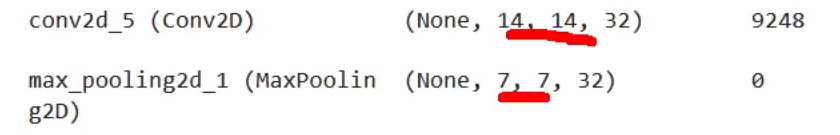

Global pooling works in reverse. It keeps 1 element from each channel.

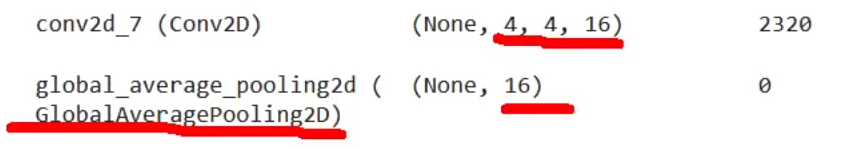

In [13]:
model.layers[0].kernel.shape

TensorShape([3, 3, 1, 32])

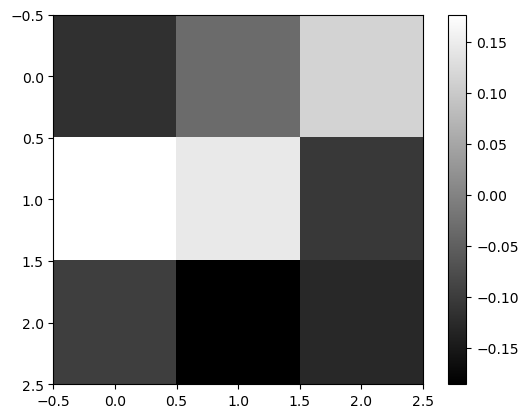

In [15]:
plt.imshow(model.layers[0].kernel[:, :, :, 0], cmap = "gray")
plt.colorbar()
plt.show()

TypeError: Invalid shape (3, 3, 32) for image data

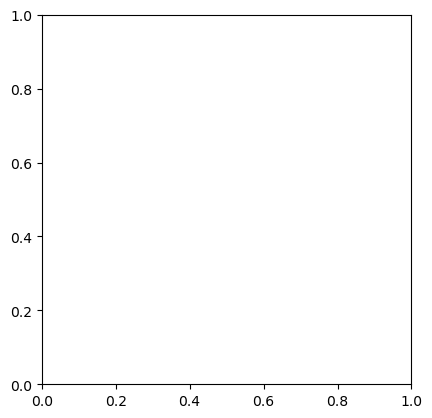

In [16]:
plt.imshow(model.layers[3].kernel[:, :, :, 0], cmap = "gray")
plt.colorbar()
plt.show()

We can't show this filter as an image because it has 32 channels, not 3. 

In [17]:
model.layers[3].kernel.shape

TensorShape([3, 3, 32, 16])

## Generalizations and Expansions

### Residual Networks
The most common "trick" is to skip layers. We need a very deep NN 50/100 layers.

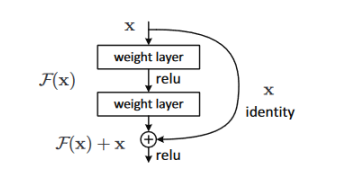


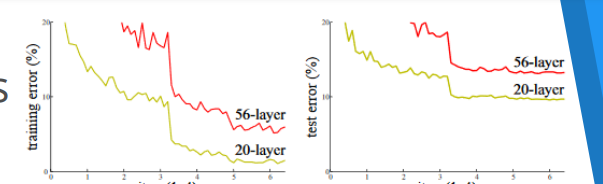


More complex models - more layers => vanishing gradients => barely any weight change per epoch => trains slower. They converge slower. Which means we can give them a higher learning rate, but we risk missing a minimum.

So how do we solve vanishing gradients? Simply don't let them vanish. Hence [ResNets](https://arxiv.org/pdf/1512.03385v1.pdf).

The idea is to skip a couple of layers and add the weight directly after them. This means the shapes need to be the same. So we cant reduce or increase the size of the layers we skip.

So far we used Sequential() for creating DenseNN. We cant use that for the ResNets. So we use [Model](https://www.tensorflow.org/api_docs/python/tf/keras/Model).

In [2]:
input = Input((20, 20, 32))

In [11]:
x = Conv2D(32, (3, 3), padding = "same", activation = "relu")(input)
resnet_block_start = Conv2D(32, (3, 3), padding = "same", activation = "relu")(x)

long_path = Conv2D(32, (3, 3), padding = "same", activation = "relu")(resnet_block_start)
long_path = Conv2D(32, (3, 3), padding = "same", activation = "relu")(long_path)

concat = Concatenate()([long_path, resnet_block_start])

x = Conv2D(32, (3, 3), activation = "relu")(concat)

In [12]:
x

<KerasTensor: shape=(None, 18, 18, 32) dtype=float32 (created by layer 'conv2d_14')>

In [13]:
resnet_block = Model(inputs = [resnet_block_start], outputs = [concat])

In [14]:
resnet_block.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 20, 20, 32)]         0         []                            
                                                                                                  
 conv2d_12 (Conv2D)          (None, 20, 20, 32)           9248      ['input_2[0][0]']             
                                                                                                  
 conv2d_13 (Conv2D)          (None, 20, 20, 32)           9248      ['conv2d_12[1][0]']           
                                                                                                  
 concatenate_2 (Concatenate  (None, 20, 20, 64)           0         ['conv2d_13[1][0]',           
 )                                                                   'input_2[0][0]']       

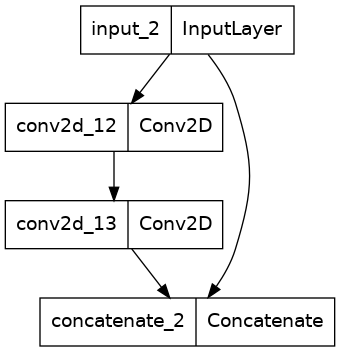

In [15]:
tf.keras.utils.plot_model(resnet_block)

We can cut parts of out model into blocks and reuse them. This way we can create large DNN very easily.

"Residual" networks because the residual of the vaninishing gradient gets passed through

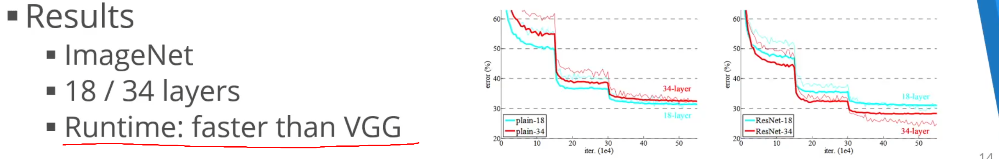

Keep in mind Concatenate doubles the volume. We can use Add as alternative

To create a Dense(1) layer in a ConvNN we need to use Conv2D(32, (1,1))

The filter is (1,1) so it doesn't change the size of the image and it just multiplies each pixel with a number $ W * x + b $ 

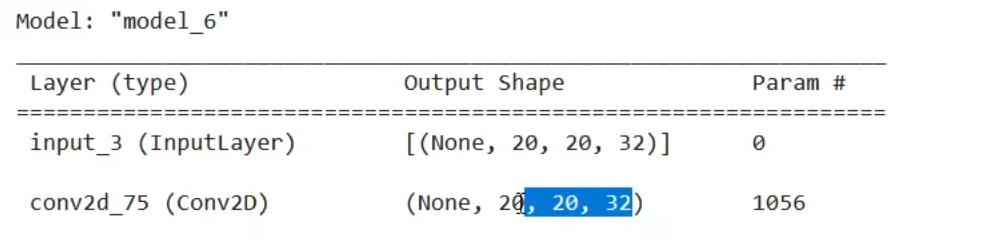

It is called [Network in Network](https://arxiv.org/pdf/1312.4400.pdf). A way to embed a DenseNN in a ConvNN.

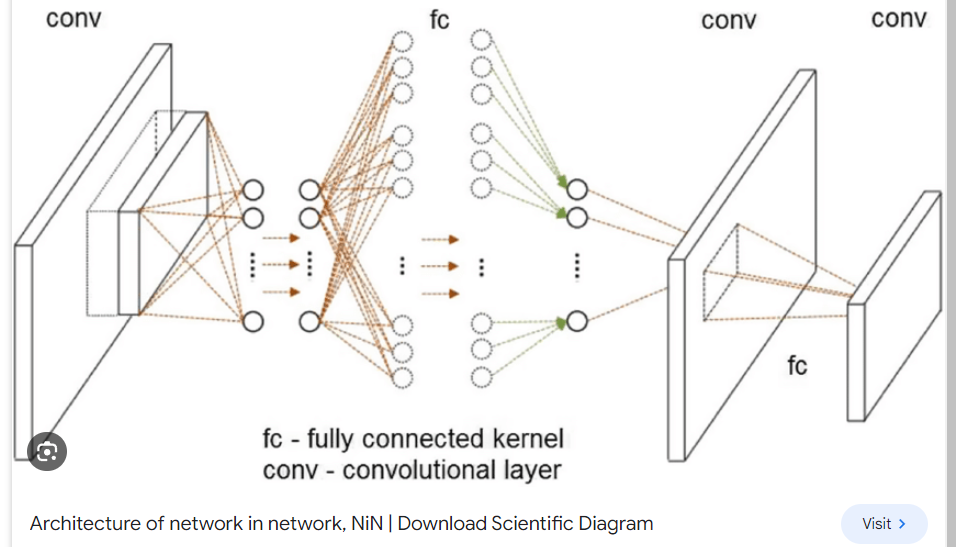

Inception net does something interesting. It gives a block a lot of "pathways". Some short some long and if a long path gets vanishing/exploading gradients it can choose the shorter path instead.

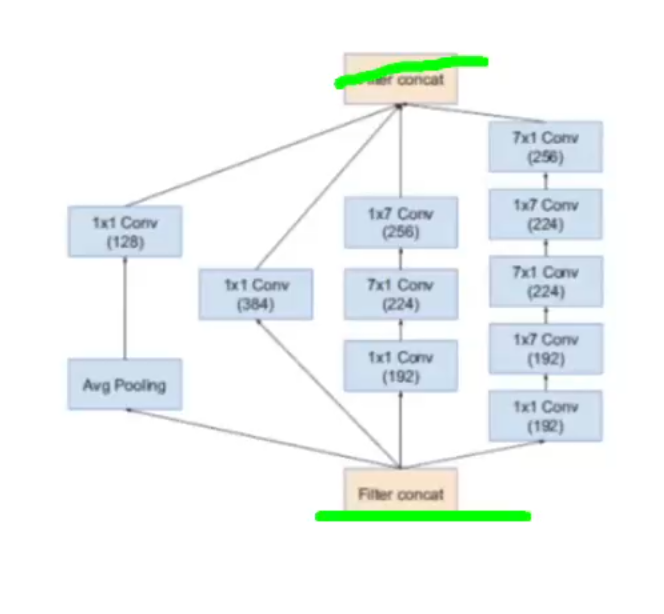

## We can import an use already trained models like:

In [16]:
from tensorflow.keras.applications import ResNet101

In [22]:
resnet = ResNet101(weights = None)

In [23]:
resnet.summary()

Model: "resnet101"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_6 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_6[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                      

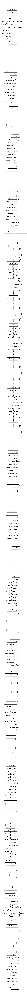

In [24]:
tf.keras.utils.plot_model(resnet)

Here they use Add instead of Concatenate. If we can manage the double volume we should use Concatenate.

We can download the model with the weights and use it

In [29]:
resnet = ResNet101(weights = "imagenet", include_top = False)

171446536/171446536 [==============================] - 17s 0us/step


## Transfer Learning

How to extend an already trained model
```
x = Dense(num_classes, activation = "softmax")(resnet.output)

# This syntax doesn't work exactly like this but the idea is to do sth like this and tune the model and use it in your own way
model = Model(inputs = resnet.input, outputs = [x]) 
```


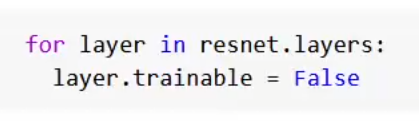 

If we attach a couple of our layers to resnet for example.
We can freeze the training process for the initial resnet layers as such.

Then we can train the NN and we will only be modifying our layers that are using the resnet as "input". Pretty cool

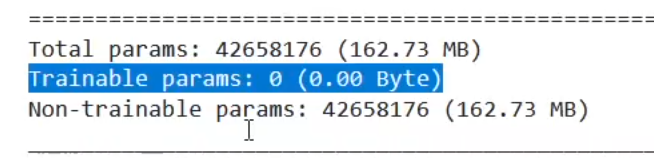

In essense we freeze the feature extraction part and we train only the classification we slapped on its back. Voilà

## Fine tuning

We fit the whole model again on a smaller dataset to well ... "fine tune it"

It is a good practice to have a config file for your model

where to get already trained models:

- https://www.tensorflow.org/hub
- https://github.com/tensorflow/models

Duration left: -31:04